In [2]:
!nvidia-smi

Thu Feb 27 17:24:01 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.216.01             Driver Version: 535.216.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|


|   0  NVIDIA L4                      On  | 00000000:00:03.0 Off |                    0 |
| N/A   52C    P8              17W /  72W |      0MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+----------------------+
                                                                                         
+---------------------------------------------------------------------------------------+
| Processes:                                                                            |
|  GPU   GI   CI        PID   Type   Process name                            GPU Memory |
|        ID   ID                                                             Usage      |
|=======================================================================================|
|  No running processes found                                                           |
+---------

In [3]:
# %pip install segment-geospatial groundingdino-py -q

# 1. Defining Model

In [4]:
import leafmap
from samgeo.text_sam import LangSAM

sam = LangSAM(model_type="sam2-hiera-large")

final text_encoder_type: bert-base-uncased


# 2. Data Preparation

In [6]:
import rasterio
import numpy as np
from rasterio.transform import Affine

def convert_file_to_int8_bandwise(file_path, out_file_path):
    # Open the input file
    with rasterio.open(file_path) as src:
        # Get metadata from input
        profile = src.profile.copy()
        
        # Read all bands
        data = src.read()
        num_bands = src.count
        
        # Create output array
        output_data = np.zeros_like(data, dtype=np.uint8)
        
        # Apply bandwise min-max stretching
        for band_idx in range(num_bands):
            band_data = data[band_idx]
            
            # Get actual min and max values for this band
            min_val = np.min(band_data)
            max_val = np.max(band_data)
            
            # Skip stretching if the band has no range
            if max_val > min_val:
                # Apply linear stretch to 0-255 range
                stretched_data = ((band_data - min_val) / (max_val - min_val) * 255)
                output_data[band_idx] = stretched_data.astype(np.uint8)
            else:
                # If all values are the same, set to 0 or preserve original value
                output_data[band_idx] = np.zeros_like(band_data, dtype=np.uint8)
                if min_val > 0:
                    output_data[band_idx] = np.ones_like(band_data, dtype=np.uint8) * min(255, int(min_val))
        
        # Update profile for the output
        profile.update(
            dtype=rasterio.uint8,
            driver='GTiff',
            nodata=0
        )
        
        # Write to output file
        with rasterio.open(out_file_path, 'w', **profile) as dst:
            dst.write(output_data)

In [163]:
import os
from tqdm import tqdm

test_folder_path = "samgeo/WorldView/Test/Image"
test_int8_folder_path = "samgeo/WorldView/Test/Image_Int8_v2"

os.makedirs(test_int8_folder_path, exist_ok=True)

images = os.listdir(test_folder_path)
count = 0
for image in tqdm(images):
    image_path = os.path.join(test_folder_path, image)
    image_int8_path = os.path.join(test_int8_folder_path, image)
    
    convert_file_to_int8(image_path, image_int8_path)
    count += 1

print(f"Converted {count} images to Int8 format")

100%|██████████| 122/122 [00:01<00:00, 108.89it/s]

Converted 122 images to Int8 format


In [8]:
palette ={ 0 : (0,0,0),  #no data 
           1 : (128, 255, 0), #forest
           2 : (166, 0, 204), #mine
           3 : (204, 0, 0), #road
           4 : (255, 0, 0), #disc urban   
           5 : (255, 255, 168), #arable land
           6 : (255,230,166), #heteregonous agricultural areas
           7 : (231, 40, 252), #permenant crops
           8 : (0, 204, 242),  #inland waters
           9 : (255, 166, 255),  #artificial non-agricultural vegetated areas
           10: (204, 77, 242), #industrial or commercial units
           11: (204, 242, 77), #shrub and/or herbaceous vegetation
           12: (230, 0, 77) #continuous urban fabric
         }

invert_palette = {v: k for k, v in palette.items()}

id2label = {
    0: "No Data",
    1: "Forest",
    2: "Mine",
    3: "Road",
    4: "Discontinuous Urban",
    5: "Arable Land",
    6: "Heterogeneous Agricultural Areas",
    7: "Permanent Crops",
    8: "Inland Waters",
    9: "Artificial Non-Agricultural Vegetated Areas",
    10: "Industrial or commercial units",
    11: "Shrub or herbaceous vegetation",
    12: "Continuous urban fabric"
}

label2id = {label: id for id, label in id2label.items()}

NUM_CLASSES = len(id2label)

def convert_to_color(arr_2d, palette=palette):
    """ Numeric labels to RGB-color encoding """
    arr_3d = np.zeros((arr_2d.shape[0], arr_2d.shape[1], 3), dtype=np.uint8)

    for c, i in palette.items():
        m = arr_2d == c
        arr_3d[m] = i

    return arr_3d

def convert_from_color(arr_3d, palette=invert_palette):
    """ RGB-color encoding to grayscale labels """
    arr_2d = np.zeros((arr_3d.shape[0], arr_3d.shape[1]), dtype=np.uint8)

    for c, i in palette.items():
        m = np.all(arr_3d == np.array(c).reshape(1, 1, 3), axis=2)
        arr_2d[m] = i

    return arr_2d

NUM_CLASSES

13

In [ ]:
class_to_prompt_dict = {
    "No Data": "No Data",
    "Forest": "Forest",
    "Mine": "Bareland",
    "Road": "Road",
    "Discontinuous Urban": "Building",
    "Arable Land": "Agriculture",
    "Heterogeneous Agricultural Areas": "Agriculture",
    "Permanent Crops": "Agriculture",
    "Inland Waters": "Water",
    "Artificial Non-Agricultural Vegetated Areas": "Building",
    "Industrial or commercial units": "Building",
    "Shrub or herbaceous vegetation": "Shrub",
    "Continuous urban fabric": "Building"
}

# Create a list of unique prompt classes
unique_prompt_classes = list(set(class_to_prompt_dict.values()))

# Create mappings between prompt classes and IDs
prompt2id = {prompt_class: idx for idx, prompt_class in enumerate(unique_prompt_classes)}
id2prompt = {idx: prompt_class for idx, prompt_class in enumerate(unique_prompt_classes)}

prompt_label2id = prompt2id
prompt_id2label = id2prompt

PROMPT_NUM_CLASSES = len(prompt_id2label)

# Create palette for prompt classes
palette_prompt = {}
for original_id, color in palette.items():
    original_label = id2label[original_id]
    prompt_class = class_to_prompt_dict[original_label]
    prompt_id = prompt2id[prompt_class]
    # We might have multiple original classes mapping to the same prompt class
    # In case of conflicts, we're using the last assignment
    palette_prompt[prompt_id] = color

# Create the inverse palette for prompt classes
invert_palette_prompt = {v: k for k, v in palette_prompt.items()}

prompt_palette = palette_prompt
prompt_invert_palette = invert_palette_prompt

def convert_to_color_prompt(arr_2d, palette=palette_prompt):
    """
    Convert numeric labels in prompt class space to RGB-color encoding
    
    Args:
        arr_2d: 2D array with prompt class IDs
        palette: Dictionary mapping prompt class IDs to RGB colors
        
    Returns:
        3D array with RGB color encoding
    """
    arr_3d = np.zeros((arr_2d.shape[0], arr_2d.shape[1], 3), dtype=np.uint8)

    for c, i in palette.items():
        m = arr_2d == c
        arr_3d[m] = i

    return arr_3d

def convert_from_color_prompt(arr_3d, palette=invert_palette_prompt):
    """
    Convert RGB-color encoding to prompt class IDs
    
    Args:
        arr_3d: 3D array with RGB color encoding
        palette: Dictionary mapping RGB colors to prompt class IDs
        
    Returns:
        2D array with prompt class IDs
    """
    arr_2d = np.zeros((arr_3d.shape[0], arr_3d.shape[1]), dtype=np.uint8)

    for c, i in palette.items():
        m = np.all(arr_3d == np.array(c).reshape(1, 1, 3), axis=2)
        arr_2d[m] = i

    return arr_2d

def original_class_to_prompt_class(original_id):
    """
    Convert original class ID to prompt class ID
    
    Args:
        original_id: Original class ID
        
    Returns:
        Prompt class ID
    """
    original_label = id2label[original_id]
    prompt_class = class_to_prompt_dict[original_label]
    return prompt2id[prompt_class]

def convert_original_mask_to_prompt_mask(original_mask):
    """
    Convert a mask with original class IDs to a mask with prompt class IDs
    
    Args:
        original_mask: 2D array with original class IDs
        
    Returns:
        2D array with prompt class IDs
    """
    prompt_mask = np.zeros_like(original_mask)
    
    for original_id in np.unique(original_mask):
        if original_id in id2label:
            prompt_id = original_class_to_prompt_class(original_id)
            prompt_mask[original_mask == original_id] = prompt_id
            
    return prompt_mask

# Display information about the prompt classes
print("Prompt Classes:")
for idx, prompt_class in id2prompt.items():
    print(f"ID: {idx}, Class: {prompt_class}, Color: {palette_prompt.get(idx, 'Not assigned')}")
    
print("\nOriginal to Prompt Class Mapping:")
for original_label, prompt_class in class_to_prompt_dict.items():
    original_id = label2id[original_label]
    prompt_id = prompt2id[prompt_class]
    print(f"Original: {original_id} ({original_label}) -> Prompt: {prompt_id} ({prompt_class})")

Prompt Classes:
ID: 0, Class: Agriculture, Color: (231, 40, 252)
ID: 1, Class: Road, Color: (204, 0, 0)
ID: 2, Class: Shrub, Color: (204, 242, 77)
ID: 3, Class: Bareland, Color: (166, 0, 204)
ID: 4, Class: Forest, Color: (128, 255, 0)
ID: 5, Class: Building, Color: (230, 0, 77)
ID: 6, Class: No Data, Color: (0, 0, 0)
ID: 7, Class: Water, Color: (0, 204, 242)

Original to Prompt Class Mapping:
Original: 0 (No Data) -> Prompt: 6 (No Data)
Original: 1 (Forest) -> Prompt: 4 (Forest)
Original: 2 (Mine) -> Prompt: 3 (Bareland)
Original: 3 (Road) -> Prompt: 1 (Road)
Original: 4 (Discontinuous Urban) -> Prompt: 5 (Building)
Original: 5 (Arable Land) -> Prompt: 0 (Agriculture)
Original: 6 (Heterogeneous Agricultural Areas) -> Prompt: 0 (Agriculture)
Original: 7 (Permanent Crops) -> Prompt: 0 (Agriculture)
Original: 8 (Inland Waters) -> Prompt: 7 (Water)
Original: 9 (Artificial Non-Agricultural Vegetated Areas) -> Prompt: 5 (Building)
Original: 10 (Industrial or commercial units) -> Prompt: 5 (B

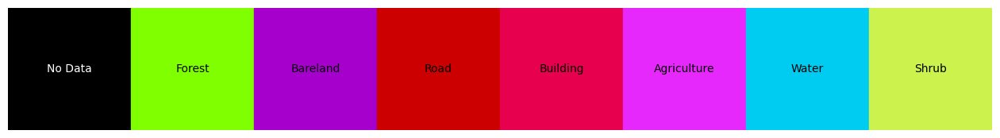

In [29]:
# visualize prompt palette
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(16, 2))
for i, (id, color) in enumerate(prompt_palette.items()):
    ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=np.array(color) / 255))
    ax.text(i + 0.5, 0.5, prompt_id2label[id], va='center', ha='center', color="white" if prompt_id2label[id] == "No Data" else "black")
ax.set_xlim(0, len(prompt_palette))
ax.set_ylim(0, 1)
ax.axis('off')
plt.show()

In [11]:
import os
import numpy as np
import rasterio

images_folder_path = "samgeo/WorldView/Test/Image_Int8_v2"
masks_folder_path = "samgeo/WorldView/Test/Mask"

def read_image(image_path):
    with rasterio.open(image_path) as src:
        return src.read()
    
def read_mask(mask_path):
    with rasterio.open(mask_path) as src:
        return src.read()
    
def read_image_and_mask(name):
    image_path = os.path.join(images_folder_path, name)
    mask_path = os.path.join(masks_folder_path, name)
    
    image = read_image(image_path)
    mask = read_mask(mask_path)

    return image, mask

# 3. Evaluating Model

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score

def calculate_metrics(y_true, y_pred):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()
    
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    iou = jaccard_score(y_true, y_pred).item()
    
    return accuracy, precision, recall, f1, iou
    

In [26]:
def predict(image, mask):    
    # Ground truth mask
    one_hot_mask = np.eye(PROMPT_NUM_CLASSES)[mask]
    one_hot_mask = np.moveaxis(one_hot_mask, -1, 0)
    
    # Initialize a tensor to store logits for all classes
    H, W = mask.shape
    all_logits = np.zeros((PROMPT_NUM_CLASSES, H, W), dtype=np.float32)
    all_masks = np.zeros((PROMPT_NUM_CLASSES, H, W), dtype=np.uint8)
    
    unique_classes = np.unique(mask)
    for class_index, class_name in prompt_id2label.items():
        # if class_index == 0:  # Skip background/unknown class
        #     continue
        if class_index not in unique_classes:
            continue
            
        # class_prompt = class_to_prompt_dict[class_name]
        class_prompt = class_name
        masks, boxes, phrases, logits = sam.predict(image_path, class_prompt, box_threshold=box_threshold, text_threshold=text_threshold, return_results=True)
        
        if len(masks) == 0:
            continue
            
        # Combine masks based on logits
        for i, (mask_i, logit_i) in enumerate(zip(masks, logits)):            
            # Convert logit_i from tensor to numpy if necessary
            if not isinstance(logit_i, (np.ndarray, np.number, float, int)):
                # For PyTorch tensors
                if hasattr(logit_i, 'detach') and hasattr(logit_i, 'cpu') and hasattr(logit_i, 'numpy'):
                    logit_i = logit_i.detach().cpu().numpy()
                # For TensorFlow tensors
                elif hasattr(logit_i, 'numpy'):
                    logit_i = logit_i.numpy()
                else:
                    logit_i = float(logit_i)  # Fallback to simple float conversion
            
            # Update the logits where the mask is active
            all_logits[class_index] = np.maximum(all_logits[class_index], mask_i * logit_i)
            all_masks[class_index] = np.maximum(all_masks[class_index], mask_i)
    
    # Create final mask by selecting the class with highest logit for each pixel
    final_mask = np.zeros((H, W), dtype=np.uint8)
    
    # First check if any class was detected at each pixel
    detected_pixels = np.max(all_masks, axis=0) > 0
    
    # For pixels where at least one class was detected, assign the class with highest logit
    if np.any(detected_pixels):
        # Get the class with highest logit for each pixel
        best_class_indices = np.argmax(all_logits, axis=0)
        
        # Only assign a class if the pixel was detected by at least one mask
        final_mask[detected_pixels] = best_class_indices[detected_pixels]
    return final_mask

In [ ]:
H, W = 512, 512

box_threshold = 0.1
text_threshold = 0.2

In [ ]:
from tqdm import tqdm

# Initialize dictionaries to store concatenated predictions and ground truth
concatenated_data = {
    class_index: {
        "y_true": [],
        "y_pred": []
    } for class_index in prompt_id2label.keys() if prompt_id2label[class_index] != "No Data"
}

# Process all images and collect predictions
names = os.listdir(images_folder_path)
for name in tqdm(names):
    image_path = os.path.join(images_folder_path, name)
    
    # Read and process image and mask
    image, colored_mask = read_image_and_mask(name)
    colored_mask = np.moveaxis(colored_mask, 0, -1)

    mask_old = convert_from_color(colored_mask)
    mask = convert_original_mask_to_prompt_mask(mask_old)
    
    # Ground truth mask as one-hot encoding
    one_hot_mask = np.eye(PROMPT_NUM_CLASSES)[mask]
    one_hot_mask = np.moveaxis(one_hot_mask, -1, 0)
    
    # Initialize tensors for predictions
    H, W = mask.shape
    all_logits = np.zeros((PROMPT_NUM_CLASSES, H, W), dtype=np.float32)
    all_masks = np.zeros((PROMPT_NUM_CLASSES, H, W), dtype=np.uint8)
    
    # Process each class that exists in the current image
    unique_classes = np.unique(mask)
    for class_index, class_name in prompt_id2label.items():
        if class_index not in unique_classes:
            continue
            
        class_prompt = class_name
        masks, boxes, phrases, logits = sam.predict(image_path, class_prompt, box_threshold=box_threshold, text_threshold=text_threshold, return_results=True)
        
        if len(masks) == 0:
            continue
            
        # Combine masks based on logits
        for i, (mask_i, logit_i) in enumerate(zip(masks, logits)):            
            # Convert logit_i from tensor to numpy if necessary
            if not isinstance(logit_i, (np.ndarray, np.number, float, int)):
                # For PyTorch tensors
                if hasattr(logit_i, 'detach') and hasattr(logit_i, 'cpu') and hasattr(logit_i, 'numpy'):
                    logit_i = logit_i.detach().cpu().numpy()
                # For TensorFlow tensors
                elif hasattr(logit_i, 'numpy'):
                    logit_i = logit_i.numpy()
                else:
                    logit_i = float(logit_i)  # Fallback to simple float conversion
            
            # Update the logits where the mask is active
            all_logits[class_index] = np.maximum(all_logits[class_index], mask_i * logit_i)
            all_masks[class_index] = np.maximum(all_masks[class_index], mask_i)
    
    # Create final mask by selecting the class with highest logit for each pixel
    final_mask = np.zeros((H, W), dtype=np.uint8)
    
    # First check if any class was detected at each pixel
    detected_pixels = np.max(all_masks, axis=0) > 0
    
    # For pixels where at least one class was detected, assign the class with highest logit
    if np.any(detected_pixels):
        # Get the class with highest logit for each pixel
        best_class_indices = np.argmax(all_logits, axis=0)
        
        # Only assign a class if the pixel was detected by at least one mask
        final_mask[detected_pixels] = best_class_indices[detected_pixels]
    
    # Collect true and predicted binary masks for each class
    for class_index in concatenated_data.keys():
        # Skip if class wasn't in the original mask
        if class_index not in np.unique(mask):
            continue
            
        # Get binary masks for this class
        true_class_mask = one_hot_mask[class_index].flatten()
        predicted_class_mask = (final_mask == class_index).flatten().astype(np.uint8)
        
        # Append to concatenated data
        concatenated_data[class_index]["y_true"].extend(true_class_mask.tolist())
        concatenated_data[class_index]["y_pred"].extend(predicted_class_mask.tolist())

# Calculate metrics for each class using concatenated data
concatenated_metrics = {}
for class_index, data in concatenated_data.items():
    class_name = prompt_id2label[class_index]
    
    # Skip if no data was collected for this class
    if len(data["y_true"]) == 0:
        continue
    
    # Convert lists to numpy arrays
    y_true = np.array(data["y_true"])
    y_pred = np.array(data["y_pred"])
    
    # Calculate metrics
    accuracy, precision, recall, f1, iou = calculate_metrics(y_true, y_pred)
    
    concatenated_metrics[class_name] = {
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "IoU": iou
    }


100%|██████████| 122/122 [04:05<00:00,  2.01s/it]


In [ ]:
import pandas as pd

# Create DataFrame from the concatenated metrics
df_concat_metrics = pd.DataFrame.from_dict(concatenated_metrics, orient='index')

# Round values to 4 decimal places
df_concat_metrics = df_concat_metrics.round(4)

# Display the DataFrame
print("Metrics calculated on concatenated predictions:")
print(df_concat_metrics)

# Calculate overall metrics across all classes
all_y_true = []
all_y_pred = []

for class_index, data in concatenated_data.items():
    if len(data["y_true"]) > 0:
        all_y_true.extend(data["y_true"])
        all_y_pred.extend(data["y_pred"])

if len(all_y_true) > 0:
    # Calculate overall metrics
    overall_accuracy, overall_precision, overall_recall, overall_f1, overall_iou = calculate_metrics(
        np.array(all_y_true), 
        np.array(all_y_pred)
    )
    
    # Add overall metrics to DataFrame
    overall_metrics = {
        "Accuracy": overall_accuracy,
        "Precision": overall_precision,
        "Recall": overall_recall,
        "F1 Score": overall_f1,
        "IoU": overall_iou
    }
    
    df_concat_metrics.loc["Overall"] = pd.Series(overall_metrics)

Metrics calculated on concatenated predictions:
             Accuracy  Precision  Recall  F1 Score     IoU
Agriculture    0.7058     0.6773  0.4320    0.5275  0.3583
Road           0.9341     0.2073  0.1821    0.1939  0.1074
Shrub          0.9177     0.0984  0.1233    0.1094  0.0579
Bareland       0.8551     0.4118  0.3145    0.3566  0.2170
Forest         0.6643     0.5685  0.7071    0.6303  0.4601
Building       0.8064     0.9129  0.5336    0.6735  0.5077
Water          0.9075     0.4986  0.8721    0.6345  0.4646



Overall metrics across all classes:
Accuracy     0.7706
Precision    0.6281
Recall       0.5532
F1 Score     0.5883
IoU          0.4167


In [20]:
df_concat_metrics

,Accuracy,Precision,Recall,F1 Score,IoU
Agriculture,0.705800,0.677300,0.432000,0.527500,0.358300
Road,0.934100,0.207300,0.182100,0.193900,0.107400
Shrub,0.917700,0.098400,0.123300,0.109400,0.057900
Bareland,0.855100,0.411800,0.314500,0.356600,0.217000
Forest,0.664300,0.568500,0.707100,0.630300,0.460100
Building,0.806400,0.912900,0.533600,0.673500,0.507700
Water,0.907500,0.498600,0.872100,0.634500,0.464600
Overall,0.770611,0.628133,0.553178,0.588278,0.416709


# 4. Visualization

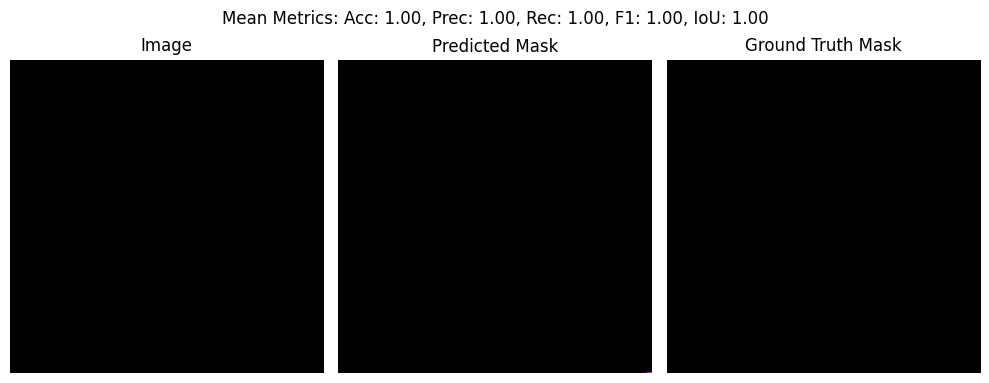

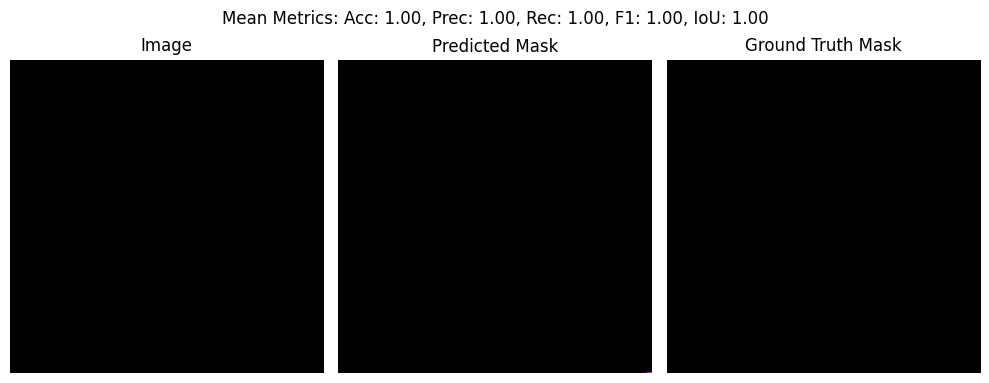

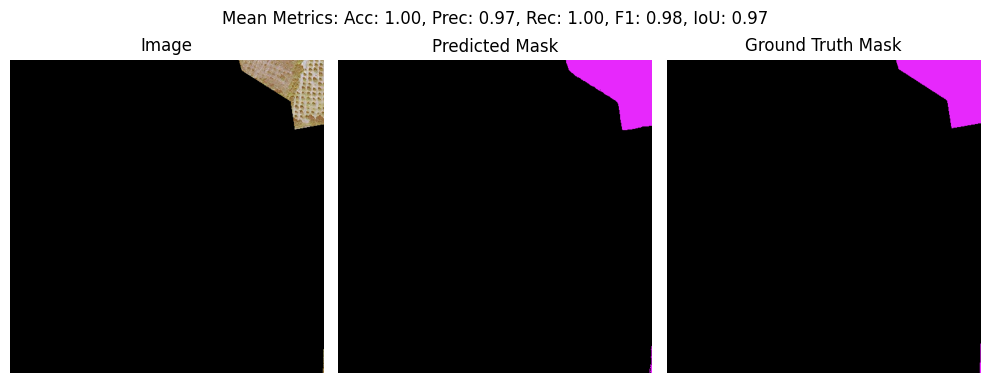

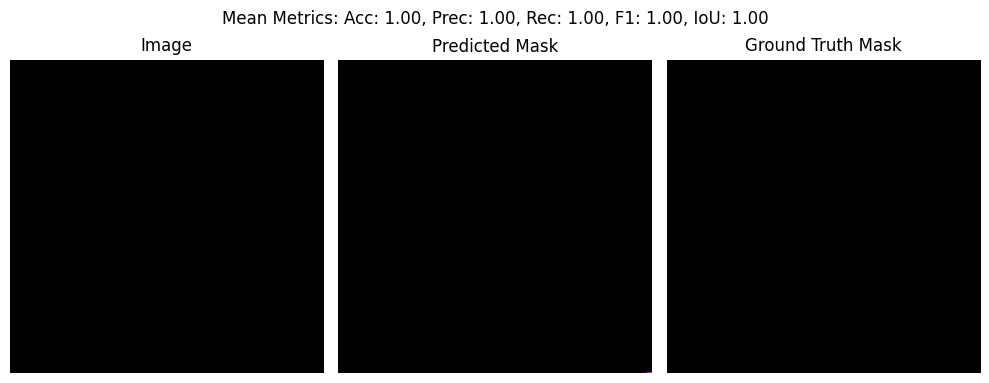

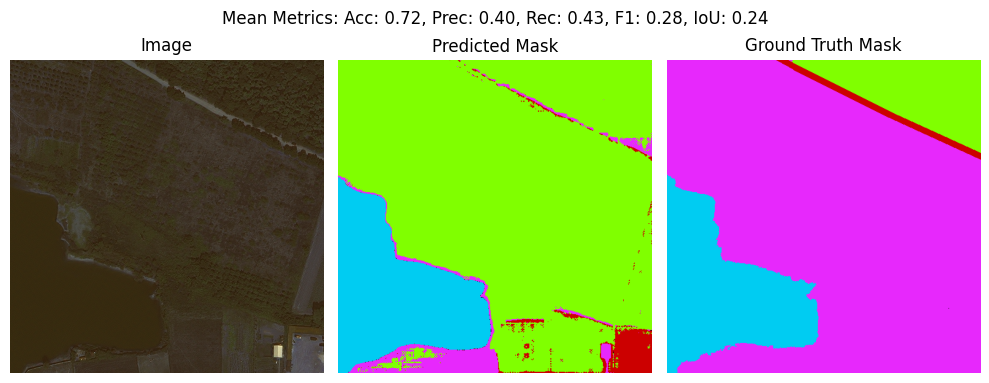

...

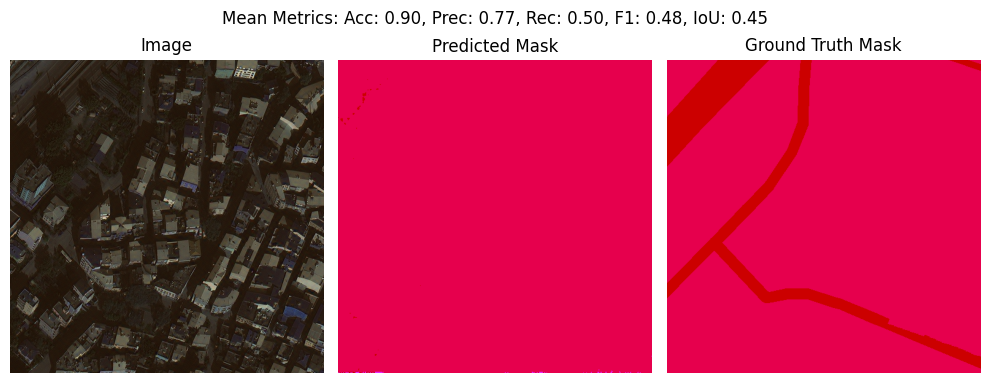

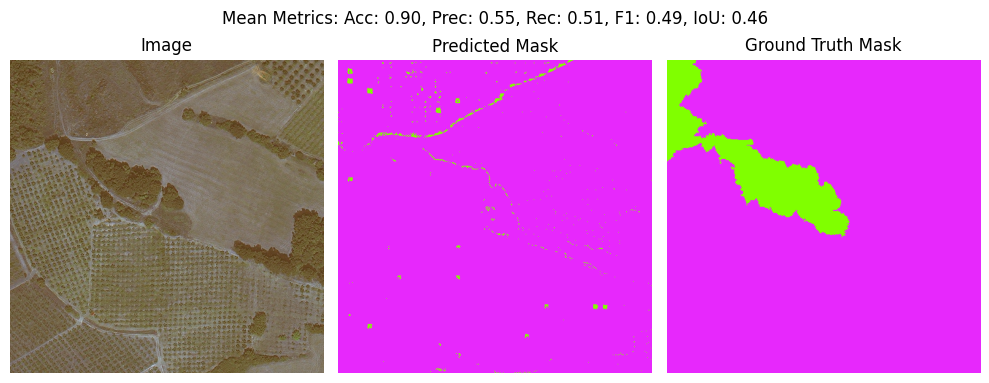

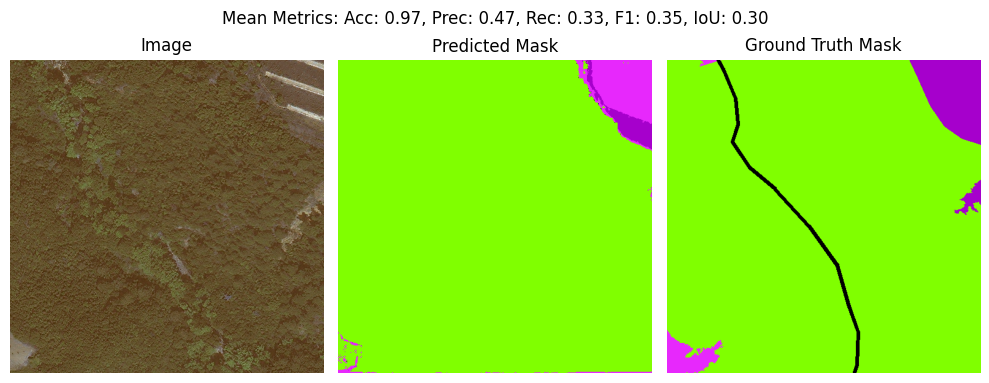

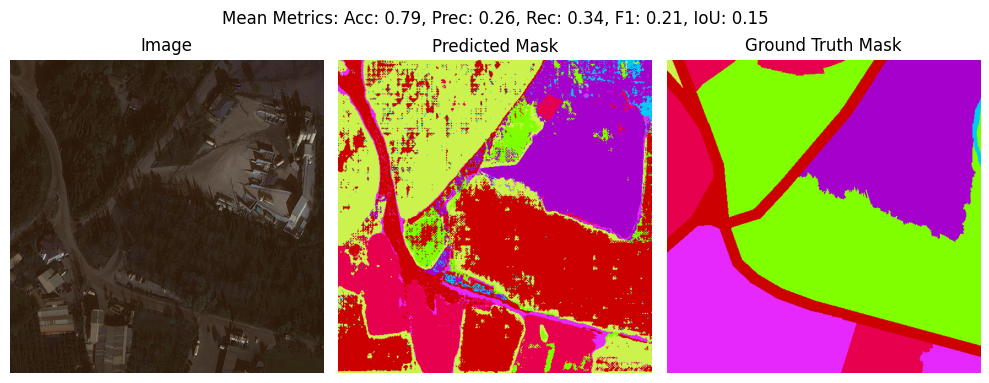

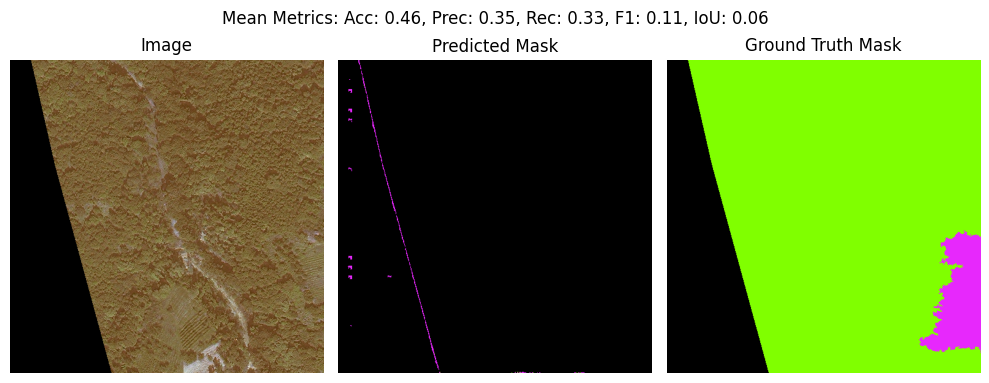

In [27]:
from tqdm import tqdm
import random
import numpy as np
names = os.listdir(images_folder_path)

random_names = random.sample(names, 50)

for name in random_names:
    image_path = os.path.join(images_folder_path, name)
    image, colored_mask = read_image_and_mask(name)
    colored_mask = np.moveaxis(colored_mask, 0, -1)

    mask_old = convert_from_color(colored_mask)
    mask = convert_original_mask_to_prompt_mask(mask_old)

    # Predict the final mask using your predict function
    final_mask = predict(image, mask)
    
    # Convert the ground truth mask to one-hot encoding
    one_hot_mask = np.eye(PROMPT_NUM_CLASSES)[mask]  # shape: (H, W, PROMPT_NUM_CLASSES)
    one_hot_mask = np.moveaxis(one_hot_mask, -1, 0)     # shape: (PROMPT_NUM_CLASSES, H, W)
    
    # Compute metrics for each class present in the ground truth
    metrics_list = []
    for class_index in range(PROMPT_NUM_CLASSES):
        if class_index not in np.unique(mask):
            continue
        
        # Get the ground truth binary mask for the class
        gt_mask = one_hot_mask[class_index]
        # Get the predicted binary mask for the class
        pred_mask = (final_mask == class_index).astype(np.uint8)
        
        # Calculate metrics using the provided function
        accuracy, precision, recall, f1, iou = calculate_metrics(gt_mask, pred_mask)
        metrics_list.append([accuracy, precision, recall, f1, iou])
    
    # Compute the mean metrics across classes if at least one class was detected
    if metrics_list:
        metrics_array = np.array(metrics_list)
        mean_metrics = metrics_array.mean(axis=0)
        mean_accuracy, mean_precision, mean_recall, mean_f1, mean_iou = mean_metrics
        title_str = (f"Mean Metrics: Acc: {mean_accuracy:.2f}, Prec: {mean_precision:.2f}, "
                     f"Rec: {mean_recall:.2f}, F1: {mean_f1:.2f}, IoU: {mean_iou:.2f}")
    else:
        title_str = "No classes detected"
    
    plt.figure(figsize=(10, 10))
    plt.suptitle(title_str, y=0.99)  # Move title up by setting y parameter
    plt.subplots_adjust(top=0.99, wspace=0.3)  # Increase top margin to reduce space below title
    plt.subplot(1, 3, 1)
    plt.title("Image")
    plt.axis("off")
    plt.imshow(np.moveaxis(image[:3], 0, -1))
    
    plt.subplot(1, 3, 2)
    plt.title("Predicted Mask")
    plt.axis("off")
    plt.imshow(convert_to_color_prompt(final_mask))
    
    plt.subplot(1, 3, 3)
    plt.title("Ground Truth Mask")
    plt.axis("off")
    plt.imshow(convert_to_color_prompt(mask))
    
    plt.tight_layout(rect=[0, 0, 1, 1.6])  # Apply tight layout while preserving space for suptitle
    plt.show()